# Normalizing flows (Neural-ODE)
*by Brandon Panos*$^{1,2,3}$

1 *University of Applied Sciences and Arts Northwestern Switzerland, Bahnhofstrasse 6, 5210 Windisch, Switzerland*   
2 *University of Bern, Astronomical Institute, Sidlerstrasse 5, 3012 Bern, Switzerland*  
3 *University of Geneva, CUI-SIP, 1205 Geneva, Switzerland* 

The material here relies heavily on the excellent summary "Normalizing Flows for Probabilistic Modeling and Inference" [(Papamakarios et.al, 2021)](https://arxiv.org/abs/1912.02762) as well as code recycling from the ODE [git repo](https://github.com/rtqichen/torchdiffeq) for PyTorch. 
**----------------------------------------------------------------------------------------------------------------------------**

Normalizing flows (NF) are a class of generative model that is capable of producing flexible probability distributions over continuous random variables $\boldsymbol{x}$ by sampling vectors $\boldsymbol{u}$ from some base distribution $p_u(\boldsymbol{u})$ and generating $\boldsymbol{x}$ via the application of a transformation $T: \boldsymbol{u}\to \boldsymbol{x}$, where $\boldsymbol{u}$ and $\boldsymbol{x}~\in\mathbb{R}^D$. Generally, the base distribution is simple to sample from with a known probability distribution. The problem is parameterized by the parameters of the base distribution $\psi$ and the parameters of the transformation $\phi$. The transformation can be modeled by a neural network $T_\phi$, which induces a family of distributions $p(\boldsymbol{x};\theta)$ over $\boldsymbol{x}$ where $\theta:=\{\phi,\psi\}$. Our goal in this notebook will be to transform a simple base distribution, a $2$-dimesnional Gaussian, into a more complex concentric circle target distribution whose density is unknown.  
![](assets/goal.png)

In [1]:
# Import libraries 
import torch 
import pickle
import numpy as np
import torch.nn as nn
from sklearn.datasets import make_circles
from torch.utils.data import Dataset, DataLoader
from torchdiffeq import odeint_adjoint as odeint
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.ticker import MultipleLocator
from utils import trace_df_dz, HyperNetwork

In [2]:
# Set the device to GPU since flows are computationally expensive
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

**Define the base and the target distributions** 

In [3]:
# Simple Gaussian since is easy to sample and has a known density 
p_z0 = torch.distributions.MultivariateNormal(
    loc=torch.tensor([0.0, 0.0]).to(device),
    covariance_matrix=torch.tensor([[0.2, 0.0], [0.0, 0.2]]).to(device))

In [4]:
# concentric circle target distribution with unknown density 
def get_batch_targets(num_samples):
    points, _ = make_circles(n_samples=num_samples, noise=0.06, factor=0.5)
    x = torch.tensor(points).type(torch.float32).to(device)
    logp_diff_t1 = torch.zeros(num_samples, 1).type(torch.float32).to(device)
    return(x, logp_diff_t1)

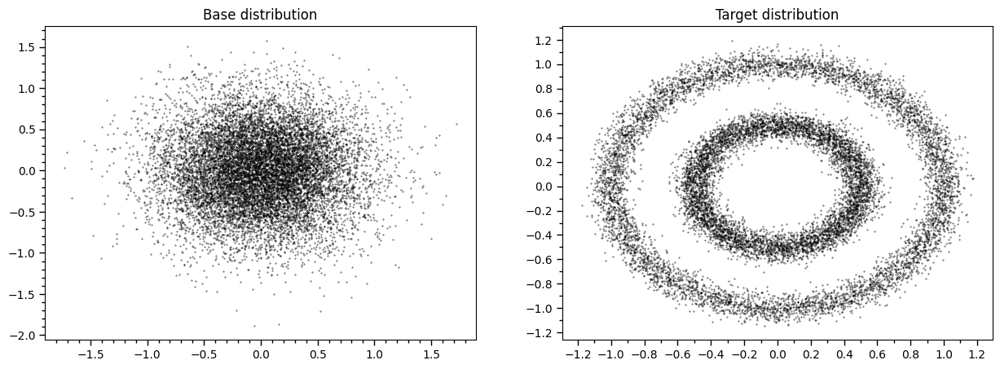

In [6]:
# Plot base and target distributions 
fig, axes = plt.subplots(1,2, figsize=(15,5))
u = p_z0.sample((12800,))
axes[0].set_title('Base distribution')
axes[0].scatter(u[:, 0], u[:, 1], c='k', s=.1)
axes[0].xaxis.set_major_locator(MultipleLocator(0.5))
axes[0].xaxis.set_minor_locator(MultipleLocator(0.1))
axes[0].yaxis.set_major_locator(MultipleLocator(0.5))
axes[0].yaxis.set_minor_locator(MultipleLocator(0.1))
axes[0].tick_params(which='major', length=5,width=1)
axes[0].tick_params(which='minor', length=3,width=1)
x, _ = get_batch_targets(12800)
axes[1].set_title('Target distribution')
axes[1].scatter(x[:, 0], x[:, 1], c='k', s=.1)
axes[1].xaxis.set_major_locator(MultipleLocator(0.2))
axes[1].xaxis.set_minor_locator(MultipleLocator(0.1))
axes[1].yaxis.set_major_locator(MultipleLocator(0.2))
axes[1].yaxis.set_minor_locator(MultipleLocator(0.1))
axes[1].tick_params(which='major', length=5,width=1)
axes[1].tick_params(which='minor', length=3,width=1)
plt.show()
plt.close(fig)

**Creat a dataloader to generate target vectors**

In [7]:
class CircleDataset(Dataset):
    def __init__(self, data):
        self.target = data[0]
        self.log_diff = data[1]
    def __len__(self):
        return len(self.target)
    def __getitem__(self, indx):
        return torch.Tensor(self.target[indx]), torch.Tensor(self.log_diff[indx])
targetloader = DataLoader(CircleDataset(get_batch_targets(12800)), batch_size=64, shuffle=True, pin_memory=True)

The task at hand is to transform a simple base distribution into a complex target distribution. A loss function that makes sense in the $KL$-divergance

$$
\begin{aligned}
\mathcal{L}(\boldsymbol{\theta}) & =D_{\mathrm{KL}}\left[p_x^*(\boldsymbol{x}) \| p_x(\boldsymbol{x} ; \phi)\right] \\\\
& = -\sum_{x\sim p^*_x(\boldsymbol{x})}p^*_x(\boldsymbol{x})\log \left[\frac{p_x(\boldsymbol{x};\phi)}{p^*_x(\boldsymbol{x})}\right]\\\\
& =-\mathbb{E}_{p_{x}^*(\boldsymbol{x})}\left[\log p_{x}(\boldsymbol{x} ; \phi)\right]+ \mathbb{E}_{p_{x}^*(\boldsymbol{x})} [\log p_x^*(\boldsymbol{x})]
\end{aligned}
$$

This equation (in particular the first term) says we can optimize the system by maximizing the log-likelihood of the flow $\boldsymbol{u}\to\boldsymbol{x}$ under the target distribution. This is not very helpful since as stipulated, we can sample from the target distribution but do not know the density $p^*_x$, meaning we cannot perform expectation maximization in this direction. We can reparameterize the equation using the change of variable formula 

$$
\begin{aligned}
p(x) &= q(\mathbf{u})|\det J_T(\boldsymbol{u})|^{-1}, ~~~ \boldsymbol{u} = T^{-1}(\boldsymbol{x}),\\\\
& = p_u\left(T^{-1}(\boldsymbol{x})\right)|\det J_{T^{-1}}(\boldsymbol{x})|^{-1},
\end{aligned}
$$

where the Jacobian determinant tells us the degree to which the space is distorted during the transformation and is used to rescale the distribution such that it sums to one. The loss function can then be recast in terms of what we know


$$
\begin{aligned}
\mathcal{L}(\boldsymbol{\theta}) & =-\mathbb{E}_{p_{x}^*(\boldsymbol{x})}\left[\log p_{u}\left(T^{-1}(\boldsymbol{x} ; \phi)\right)+\log~\left|\operatorname{det} J_{T^{-1}}(\boldsymbol{x} ;\phi)\right|\right] - S(p^*_x),\\\\
&\approx -\frac{1}{N}\sum_{n=1}^N \underbrace{\log p_u\left(T^{-1}(x_n;\phi)\right)}_{\substack{\text{maximize likelihood of flow}\\ \text{under the base distribution}}} + \underbrace{\log~\left|\det J_{T^{-1}}(x;\phi)\right|}_{\substack{\text{promote simpler transformations}\\ \text{that augment the space less}}}- \underbrace{S(p^*_x)}_{\substack{\text{entropy of target}\\ \text{distribution not used} \\ \text{in optimization}}}
\end{aligned}
$$

The above formula makes it clear that in order to obtain the forward transformation, we have to counter-intuitively train the model on the reverse task of mapping samples from $p^*_x$ to $z_0$ and then maximizing the likelihood of the transformed data under our Gaussian as seen in the image below. 

![](assets/training.png)  

One of the main cornerstones of NF is that the transformation needs to be continuous and from what we have just learned, invertible. Ordinarily, this transformation is split into a composition of smaller transformations that are parameterized by a multi-layered neural network [(Rezende and Mohamed, 2016)](https://arxiv.org/abs/1505.05770). The above conditions along with computationally tractable training, places unnecessary constraints on the model’s architecture, with many different flow types aimed at reducing the complexity of the Jacobian determinant, i.e., Jacobians that are lower triangular for example.  

It turns out that the model becomes unrestrained when instead of modeling a composition of invertible transformations, you rather use a neural network to model the system’s infinitesimal dynamics and integrate it to extract the transformation. In this framework, the problem reduces to an ordinary differential equation with initial conditions. The network approximates a vector field which then redistributes the probability mass of the base distribution into the target distribution. The time dynamics are parameterized by a NN (in our case a hyper-NN)

$$
\frac{d\boldsymbol{z}_t}{dt} = g_\phi(t, \boldsymbol{z}_t),
$$

where the only restriction is that $\boldsymbol{z_t}$ be uniform Lipschitz continuous, and both the log density and variable are transformed via integration over time 

$$
\left[\begin{array}{c}
\boldsymbol{x} \\
\log p_x(\boldsymbol{x})
\end{array}\right]=\left[\begin{array}{c}
\boldsymbol{u} \\
\log p_u(\boldsymbol{u})
\end{array}\right]+\int_{t=t_0}^{t_1}\left[\begin{array}{c}
g_\phi\left(t, \boldsymbol{z}_t\right) \\
-\operatorname{Tr}\left\{J_{g_\phi(t,)}\left(\boldsymbol{z}_t\right)\right\}
\end{array}\right] d t.
$$

What is important to note is that the density calculation only requires the evaluation of the trace of the Jacobian, which immediately frees our model selection. Additionally, the inverse transformation can be obtained via the simple flip of integration bounds. As mentioned, training through likelihood estimation is performed backward, therefore the training procedure involves solving the following ODE with initial conditions  

$$
\underbrace{\left[\begin{array}{c}
\mathbf{z}_0 \\
\log p(\boldsymbol{x})-\log p_{z_0}\left(\boldsymbol{z}_0\right)
\end{array}\right]}_{\text {solutions }}=\underbrace{+\int_{t=t_1}^{t_0}\left[\begin{array}{c}
g_\phi\left(t, \boldsymbol{z}_t\right) \\
-\operatorname{Tr}\left\{J_{g_\phi(t,)}\left(\boldsymbol{z}_t\right)\right\}
\end{array}\right] d t}_{\text {dynamics }}, \quad \underbrace{\left[\begin{array}{c}
\boldsymbol{z}_1 \\
\log p(\boldsymbol{x})-\log p\left(\boldsymbol{z}_1\right)
\end{array}\right]=\left[\begin{array}{c}
\boldsymbol{x} \\
0
\end{array}\right]}_{\text {initial values }}
$$  

The initial value problem can be solved via the use of a black box ordinary differential equations (ODE) solver. Reverse mode differentiation is performed by deriving the sensitivity of the loss function on the model’s weights $\phi$ via the use of the adjoint sensitivity method, where a second differential equation is solved backward in time such that the integration results in the partial derivative of the loss function with respect to all model parameters 

$$
\frac{\partial \mathcal{L}(\boldsymbol{x} ; \phi)}{\partial \phi}=\int_{t=t_1}^{t_0} \frac{\partial \mathcal{L}}{\partial \boldsymbol{z}_t} \frac{\partial g_\phi\left(t, \boldsymbol{z}_t\right)}{\partial \phi} d t
$$

There is a PyTorch implementation of such a solver that can be found [here](https://github.com/rtqichen/torchdiffeq).

**Model the systems infinitesimal dynamics using a neural network $g_\phi(t, \boldsymbol{z}_t)$**   

In [5]:
class CNF(nn.Module):
    def __init__(self, in_out_dim, hidden_dim, width):
        super().__init__()
        self.in_out_dim = in_out_dim
        self.hidden_dim = hidden_dim
        self.width = width
        self.hyper_net = HyperNetwork(in_out_dim, hidden_dim, width)

    def forward(self, t, states):
        z = states[0]
        logp_z = states[1]
        batchsize = z.shape[0]

        with torch.set_grad_enabled(True):
            z.requires_grad_(True)
            W, B, U = self.hyper_net(t)
            Z = torch.unsqueeze(z, 0).repeat(self.width, 1, 1)
            h = torch.tanh(torch.matmul(Z, W) + B)
            dz_dt = torch.matmul(h, U).mean(0)
            dlogp_z_dt = -trace_df_dz(dz_dt, z).view(batchsize, 1)

        return (dz_dt, dlogp_z_dt)

**Define the training loop**

In [9]:
def train(model, optimizer, n_epochs, batch_size):
    best_loss = 1e10
    num_samples = 64
    for epoch in range(n_epochs):
        epoch_loss = 0
        # Reverse trnasformation using expectation maximization  
        for x, logp_diff_t1 in targetloader: # We sample from the traget
            optimizer.zero_grad()
            
            # Apply the balck box ODE solver odeint to integrate backwards, note order of t0 and t1
            z_t, logp_diff_t = odeint(
                model,
                (x, logp_diff_t1),
                torch.tensor([t1, t0]).type(torch.float32).to(device),
                atol=1e-5,
                rtol=1e-5,
                method='dopri5',
            )
            
            # The last index is when we arive at the base distribution
            z_t0, logp_diff_t0 = z_t[-1], logp_diff_t[-1]
            
            # We want to maximize the probability of the translated point under the base distribution
            logp_x = p_z0.log_prob(z_t0).to(device) - logp_diff_t0.view(-1)
            loss = -logp_x.mean(0)
            
            # odeint uses the adjoint sensativity method to optamize over the parameters
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()

        # Keep track of traning loss
        print(f"Epoch {epoch+1} loss: {epoch_loss/len(targetloader)*batch_size}")
        if epoch_loss/len(targetloader)*batch_size < best_loss:
            best_loss = epoch_loss/len(targetloader)*batch_size
            torch.save(model.state_dict(), "best_model.pth")

**Train the model using expectation maximization**

In [6]:
t0 = 0
t1 = 1
# Initialize the model and optimizer
ode_func = CNF(in_out_dim=2, hidden_dim=32, width=64).to(device)
optimizer = torch.optim.Adam(ode_func.parameters(), lr=1e-4)
# Train the model (if it takes to long then load pre-trained model)
try: train(ode_func, optimizer, n_epochs=100, batch_size=64) # should be trained for around 350 epoch
except:ode_func.load_state_dict(torch.load('best_model_pre.pth'));

**Perform inference $\boldsymbol{u}\to\boldsymbol{z}_1$** 

In [9]:
# Integrate forwards from t0 --> t1 and go from noise to target u --> z1

viz_samples = 80000
viz_timesteps = 100
z_t0 = p_z0.sample([viz_samples]).to(device)
logp_diff_t0 = torch.zeros(viz_samples, 1).type(torch.float32).to(device)

# Apply forward model from by sampeling from the base distribution and integrating forwards
z_t_samples, _ = odeint(
    ode_func,
    (z_t0, logp_diff_t0),
    torch.tensor(np.linspace(t0, t1, viz_timesteps)).to(device),
    atol=1e-5,
    rtol=1e-5,
    method='dopri5',
)

# Turn into numpy object for plotting
z_t_samples = z_t_samples.detach().numpy()

**Create an animation of the flow**

In [19]:
for i, data in enumerate(z_t_samples):
    fig, ax = plt.subplots(figsize=(5,5))
    scatter = ax.scatter(data[:, 0], data[:, 1], c='k', s=.001)
    ax.axis('off')
    plt.savefig(f'temp/{i}.png', dpi=300)
    plt.tight_layout()
    plt.close(fig)
    break

In [9]:
# create a figure and axis object
fig, ax = plt.subplots()
# create a scatter plot with initial data
scatter = ax.scatter(z_t_samples[0, :, 0], z_t_samples[0, :, 1], c='k', s=.001)
ax.set_xlim(-2,2)
ax.set_ylim(-2,2)
ax.xaxis.set_major_locator(MultipleLocator(0.5))
ax.xaxis.set_minor_locator(MultipleLocator(0.1))
ax.yaxis.set_major_locator(MultipleLocator(0.5))
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.tick_params(which='major', length=5,width=1)
ax.tick_params(which='minor', length=3,width=1)
# do nothing in the initialization function
def init():
    return scatter,
# define a function to animate the frames
def animate(i):
    # update the scatter plot data
    data = z_t_samples[i]
    scatter.set_offsets(data)
    # set the plot limits and turn off the axis labels
    ax.set_xlim(-2,2)
    ax.set_ylim(-2,2)
    ax.xaxis.set_major_locator(MultipleLocator(0.5))
    ax.xaxis.set_minor_locator(MultipleLocator(0.1))
    ax.yaxis.set_major_locator(MultipleLocator(0.5))
    ax.yaxis.set_minor_locator(MultipleLocator(0.1))
    ax.tick_params(which='major', length=5,width=1)
    ax.tick_params(which='minor', length=3,width=1)
    return scatter,
# create the animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=100, interval=20, blit=True)
#  Close the plot
plt.close(ani._fig)
# convert the animation to HTML5 video
html5_video = ani.to_jshtml()
# display the animation in the notebook using the HTML5 video tag
HTML(html5_video)

Despite the calculation of the log density being reduced to the evaluation of a trace operator, it still requires $O(D)$ gradient calls where $D$ is the dimensionality of the input features. Neural-ODEs can be made more efficient using Hutchinson’s trace estimator (Hutchinson, 1990) which allows the estimation of the Jacobian in one backward pass, i.e., time complexity of $O(1)$. The flows can also be optimized and encouraged to follow geodesics by introducing regularization factors for optimal transport [(Finlay et.al, 2020)](https://arxiv.org/abs/2002.02798). Finally, NF are bijective mappings that due to their continuity and differentiability requirements become diffeomorphism, i.e., topologically preserving transformations whose flows can never overlap. Analogous to the use of kernels in large margin classifiers, NF can become universal by augmenting the space of the flows into a higher dimension, this is done by concatenating additional zero vectors onto the input [(Dupont et.al 2019)](https://arxiv.org/abs/1904.01681).